In [1]:
!pip install -Uqq fastbook

     |████████████████████████████████| 727kB 16.3MB/s 
     |████████████████████████████████| 194kB 63.3MB/s 
     |████████████████████████████████| 1.2MB 63.4MB/s 
     |████████████████████████████████| 51kB 9.1MB/s 
     |████████████████████████████████| 61kB 11.1MB/s 


In [2]:
import fastbook
fastbook.setup_book()

Mounted at /content/gdrive


In [3]:
from fastbook import *
from fastai.vision.widgets import *

In [4]:
key = os.environ.get('AZURE_SEARCH_KEY', '2f3ac973a52746f09f241fbb6213bf51')

In [5]:
search_images_bing

<function fastbook.search_images_bing>

In [7]:
!pip install azure-cognitiveservices-search-imagesearch

     |████████████████████████████████| 51kB 7.3MB/s 
     |████████████████████████████████| 92kB 12.1MB/s 
     |████████████████████████████████| 40kB 7.4MB/s 
     |████████████████████████████████| 51kB 9.1MB/s 
     |████████████████████████████████| 61kB 12.0MB/s 
     |████████████████████████████████| 2.6MB 15.1MB/s 


In [8]:
from itertools import chain

from azure.cognitiveservices.search.imagesearch import ImageSearchClient as api
from msrest.authentication import CognitiveServicesCredentials as auth


def search_images_bing_many(key, term, total_count=150, min_sz=224):
    """Search for images using the Bing API
    
    :param key: Your Bing API key
    :type key: str
    :param term: The search term to search for
    :type term: str
    :param total_count: The total number of images you want to return (default is 150)
    :type total_count: int
    :param min_sz: the minimum height and width of the images to search for (default is 128)
    :type min_sz: int
    :returns: An L-collection of ImageObject
    :rtype: L
    """
    headers = {"Ocp-Apim-Subscription-Key":key}
    search_url = "https://api.bing.microsoft.com/v7.0/images/search"

    max_count = 150

    imgs = []
    for offset in range(0, total_count, max_count):
        if ((total_count - offset) > max_count):
            count = max_count
        else:
            count = total_count - offset

        params = {'q':term, 'count':count, 'min_height':min_sz, 'min_width':min_sz, 'offset': offset}
        response = requests.get(search_url, headers=headers, params=params)
        search_results = response.json()
        imgs.append(L(search_results['value']))

    return L(chain(*imgs)).attrgot('contentUrl').unique()

In [ ]:
from utils import *

In [9]:
!pip install azure-cognitiveservices-search-imagesearch

In [ ]:
 def search_images_bing(key, term, max_images: int = 200, **kwargs):    
     params = {'q':term, 'count':max_images}
     headers = {"Ocp-Apim-Subscription-Key":key}
     search_url = "https://api.bing.microsoft.com/v7.0/images/search"
     response = requests.get(search_url, headers=headers, params=params)
     response.raise_for_status()
     search_results = response.json()    
     return L(search_results['value'])

In [ ]:
results = search_images_bing(key, 'adidas shoe', min_sz=128)
ims = results.attrgot('contentUrl')
len(ims)

150

In [10]:
tree_types = 'succulent','cactus','tree'
path = Path('trees')

In [11]:
tree_types

('succulent', 'cactus', 'tree')

In [12]:
path.exists()

False

In [13]:
if not path.exists():
    path.mkdir()
    for o in tree_types:
        dest = (path/o)
        dest.mkdir(exist_ok=True)
        results = search_images_bing_many(key, f'{o}',total_count=500)
        download_images(dest, urls=results)

In [ ]:
# mkdir -p trees/succulent
# cd trees/succulent
# wget -c https://scillagrace.files.wordpress.com/2018/04/succulent.jpg
# tar xf succulent.jpg

In [14]:
fns = get_image_files(path)
fns

(#1228) [Path('trees/cactus/00000381.jpg'),Path('trees/cactus/00000025.jpg'),Path('trees/cactus/00000334.jpg'),Path('trees/cactus/00000207.jpg'),Path('trees/cactus/00000287.tif'),Path('trees/cactus/00000015.jpg'),Path('trees/cactus/00000318.jpg'),Path('trees/cactus/00000286.jpg'),Path('trees/cactus/00000011.jpg'),Path('trees/cactus/00000367.jpg')...]

In [15]:
failed = verify_images(fns)
failed

(#4) [Path('trees/cactus/00000283.png'),Path('trees/tree/00000162.jpg'),Path('trees/tree/00000365.jpg'),Path('trees/succulent/00000280.jpg')]

In [16]:
failed.map(Path.unlink);

In [17]:
trees = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.3, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

In [ ]:
num_workers=1

In [ ]:
dir(trees.dataloaders)

['__call__',
 '__class__',
 '__delattr__',
 '__delwrap__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__func__',
 '__ge__',
 '__get__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__self__',
 '__setattr__',
 '__signature__',
 '__sizeof__',
 '__str__',
 '__subclasshook__']

In [19]:
dls = trees.dataloaders(path)

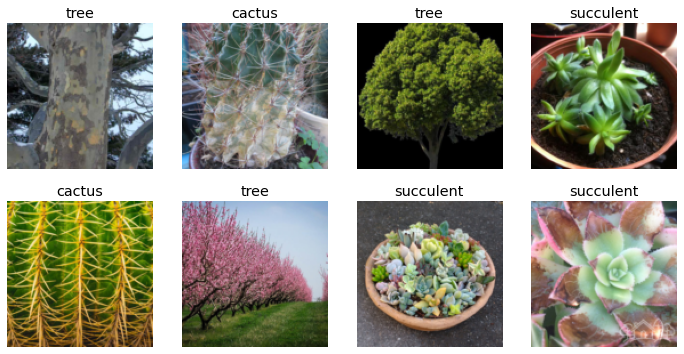

In [20]:
dls.valid.show_batch(max_n=8,nrows=2)

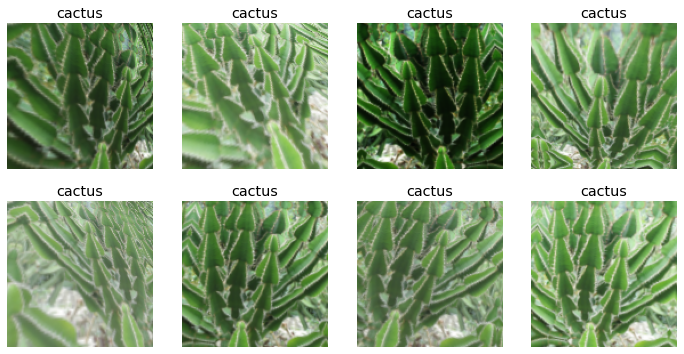

In [21]:
trees = trees.new(item_tfms=Resize(128),batch_tfms=aug_transforms(mult=2))
dls = trees.dataloaders(path)
dls.train.show_batch(max_n=8,nrows=2,unique=True)

In [22]:
trees = trees.new(
    item_tfms=RandomResizedCrop(224,min_scale=0.5),
    batch_tfms=aug_transforms())
dls = trees.dataloaders(path)

In [23]:
learn = cnn_learner(dls,resnet18,metrics=error_rate)
learn.fine_tune(10)

Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/hub/checkpoints/resnet18-5c106cde.pth


epoch,train_loss,valid_loss,error_rate,time
0,1.334090,0.564176,0.177112,00:35


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


epoch,train_loss,valid_loss,error_rate,time
0,0.682945,0.501363,0.152589,00:36
1,0.539248,0.454202,0.147139,00:36
2,0.462731,0.475159,0.158038,00:36
3,0.389863,0.458279,0.152589,00:37
4,0.329846,0.388689,0.125341,00:37
5,0.285927,0.412143,0.130790,00:37
6,0.248632,0.389387,0.133515,00:36
7,0.213117,0.363508,0.117166,00:36
8,0.179677,0.357763,0.117166,00:36
9,0.156856,0.358967,0.117166,00:36


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency e

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


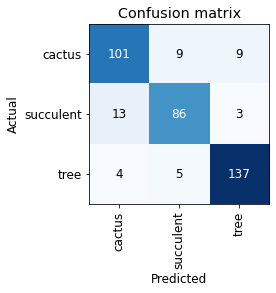

In [24]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

In [ ]:
import torch
torch.cuda.is_available()

False

In [ ]:
nvidia-smi

NameError: name 'nvidia' is not defined

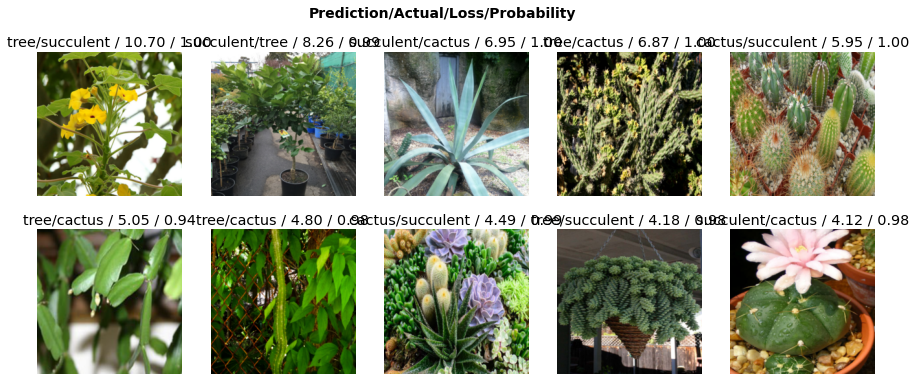

In [27]:
interp.plot_top_losses(10, nrows=2)

In [28]:
cleaner = ImageClassifierCleaner(learn)
cleaner

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


In [29]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.6/dist-packages/PIL/Image.py:932: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


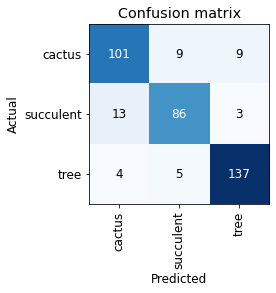

In [30]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

In [ ]:
cleaner = ImageClassifierCleaner(learn)
cleaner

/opt/conda/envs/fastai/lib/python3.8/site-packages/PIL/Image.py:951: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


In [31]:
learn.export()

In [32]:
path.ls

<bound method Path.ls of Path('trees')>

In [33]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [34]:
learn_inf = load_learner(path/'export.pkl')

In [ ]:
learn_inf.predict('images/adidas.jpg')

('adidas', tensor(0), tensor([0.5526, 0.4458, 0.0016]))

In [35]:
learn_inf.dls.vocab

['cactus', 'succulent', 'tree']

In [36]:
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [37]:
img = PILImage.create(btn_upload.data[-1])

In [38]:
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl: display(img.to_thumb(128,128))
out_pl

Output()

In [39]:
pred,pred_idx,probs = learn_inf.predict(img)

In [40]:
lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction: {pred} | Probability: {probs[pred_idx]:.04f}'
lbl_pred

Label(value='Prediction: cactus | Probability: 0.9986')

In [41]:
btn_run = widgets.Button(description='Classify')
btn_run

Button(description='Classify', style=ButtonStyle())

In [42]:
def on_click_classify(change):
    img = PILImage.create(btn_upload.data[-1])
    out_pl.clear_output()
    with out_pl: display(img.to_thumb(128,128))
    pred,pred_idx,probs = learn_inf.predict(img)
    lbl_pred.value = f'Prediction: {pred} | Probability: {probs[pred_idx]:.04f}'

btn_run.on_click(on_click_classify)

In [43]:
btn_upload = widgets.FileUpload()

In [44]:
VBox([widgets.Label('Upload a tree picture [ Cactus | Succulent | Tree ]: '), 
      btn_upload, btn_run, out_pl, lbl_pred])

In [45]:
 !pip install voila
!jupyter serverextension enable --sys-prefix voila

     |████████████████████████████████| 1.9MB 18.1MB/s 
     |████████████████████████████████| 552kB 54.6MB/s 
     |████████████████████████████████| 194kB 60.1MB/s 
     |████████████████████████████████| 112kB 63.2MB/s 
     |████████████████████████████████| 430kB 51.3MB/s 
     |████████████████████████████████| 71kB 9.4MB/s 
     |████████████████████████████████| 102kB 14.2MB/s 
  Created wheel for contextvars: filename=contextvars-2.4-cp36-none-any.whl size=7667 sha256=f2e5f9bb62f4c7c83968e5d0d28320b147a259a153ae08c16586fec2c0b91568
  Stored in directory: /root/.cache/pip/wheels/a5/7d/68/1ebae2668bda2228686e3c1cf16f2c2384cea6e9334ad5f6de
Successfully built contextvars
ERROR: nbdev 1.1.12 has requirement nbconvert<6, but you'll have nbconvert 6.0.7 which is incompatible.
ERROR: google-colab 1.0.0 has requirement tornado~=5.1.0; python_version >= "3.0", but you'll have tornado 6.1 which is incompatible.
  Found existing installation: nbconvert 5.6.1
    Uninstalling nbconvert-5.

Enabling: voila
- Writing config: /usr/etc/jupyter
    - Validating...
Error loading server extension voila
      X is voila importable?
